In [83]:
import wave
import struct
import matplotlib.pyplot as plt
from scipy.io import wavfile as wav
from skimage import util
import numpy
import scipy.io.wavfile
from scipy.fftpack import dct

sample_rate = 44100

len(signal) = 375808



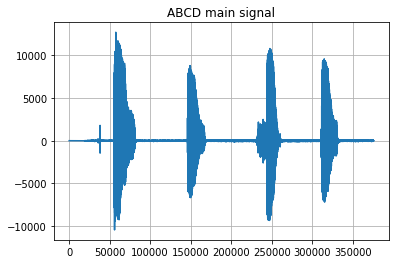

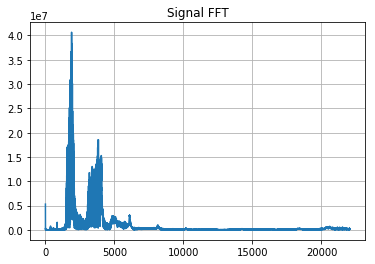

In [89]:
sample_rate, signal = scipy.io.wavfile.read('abcd_1570972107151.wav')  

print("sample_rate = {}\n".format(sample_rate))
print("len(signal) = {}\n".format(len(signal)))

signal = signal[0:int(len(signal))]

plt.plot(signal)
plt.title("ABCD main signal")
plt.grid()
plt.show()

fft_out = numpy.fft.fft(signal)

plt.plot(numpy.abs(fft_out[0:int(sample_rate/2)]))
plt.title("Signal FFT")
plt.grid()
plt.show()

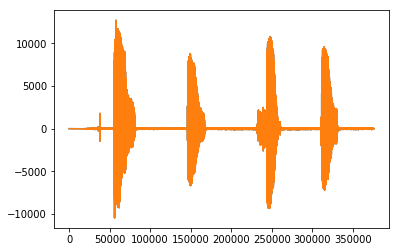

In [90]:
sample_rate, signal = scipy.io.wavfile.read('abcd_1570972107151.wav')  

plt.plot(signal)

plt.plot(signal)
plt.show()


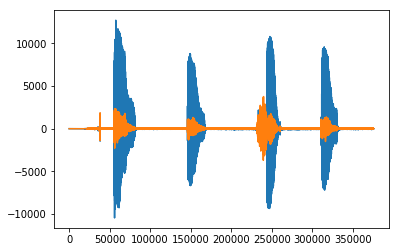

In [91]:
pre_emphasis = 0.97

emphasized_signal = numpy.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])

plt.plot(signal)
plt.plot(emphasized_signal)
plt.show()
                                                                                        

num_frames = 850

len signal = 375808



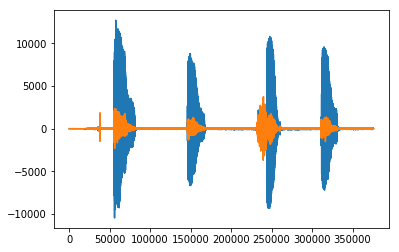

len(frames) = 850



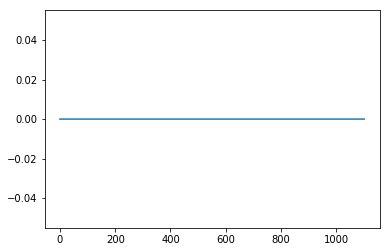

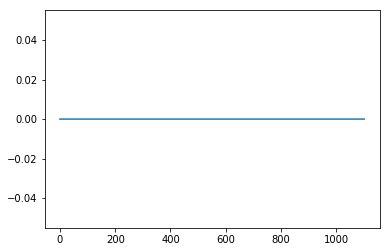

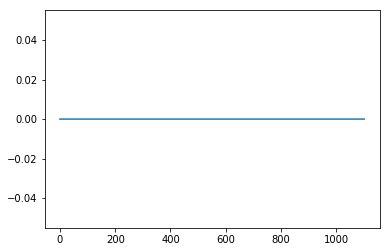

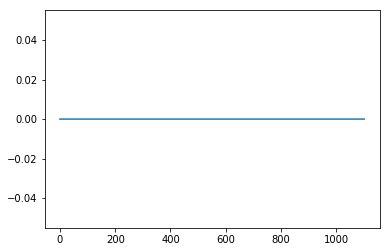

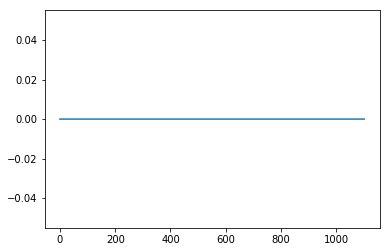

...

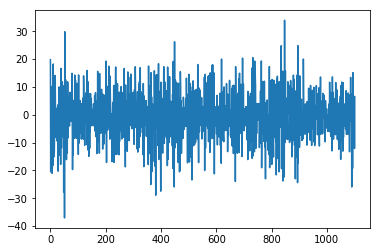

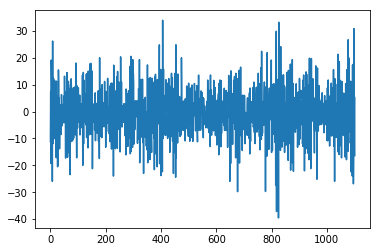

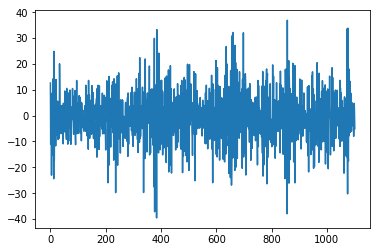

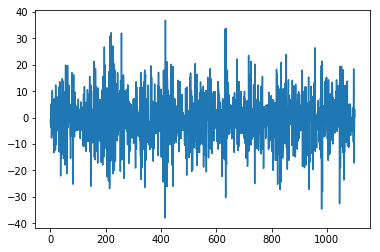

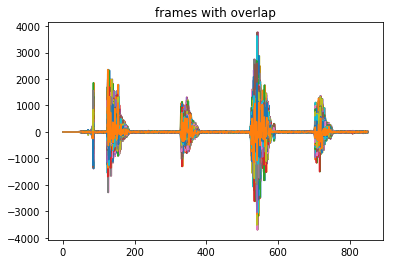

In [92]:
frame_size = 0.025
frame_stride = 0.01

frame_length, frame_step = frame_size * sample_rate, frame_stride * sample_rate 
signal_length = len(emphasized_signal)
frame_length = int(round(frame_length))
frame_step = int(round(frame_step))
num_frames = int(numpy.ceil(float(numpy.abs(signal_length - frame_length)) / frame_step))  

print("num_frames = {}\n".format(num_frames))
print("len signal = {}\n".format(len(signal)))

pad_signal_length = num_frames * frame_step + frame_length
z = numpy.zeros((pad_signal_length - signal_length))
pad_signal = numpy.append(emphasized_signal, z) 


plt.plot(signal)
plt.plot(pad_signal)
plt.show()

indices = numpy.tile(numpy.arange(0, frame_length), (num_frames, 1)) + numpy.tile(numpy.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T
frames = pad_signal[indices.astype(numpy.int32, copy=False)]


print("len(frames) = {}\n".format(len(frames)))

for i in range(0,len(frames)):
    plt.plot(frames[i])
    plt.show()

plt.plot(frames)
plt.title("frames with overlap")
plt.show()

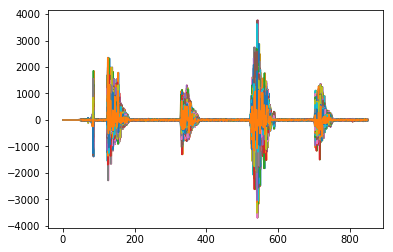

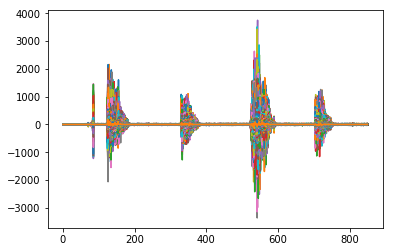

In [93]:
plt.plot(frames)
plt.show()

frames *= numpy.hamming(frame_length)

plt.plot(frames)
plt.show()

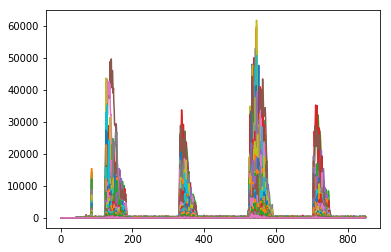

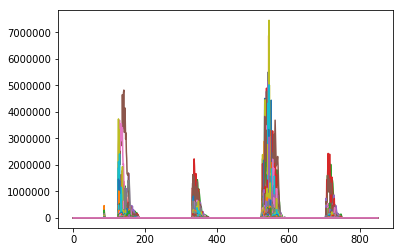

In [94]:
NFFT = 512
mag_frames = numpy.absolute(numpy.fft.rfft(frames, NFFT))  #  FFT
pow_frames = ((1.0 / NFFT) * ((mag_frames) ** 2))  # Power 

plt.plot(mag_frames)
plt.show()

plt.plot(pow_frames)
plt.show()

In [95]:
nfilt = 40

low_freq_mel = 0
high_freq_mel = (2595 * numpy.log10(1 + (sample_rate / 2) / 700))  # Convert Hz to Mel
print("low_freq_mel = {}\n".format(low_freq_mel))
print("high_freq_mel = {}\n".format(high_freq_mel))

mel_points = numpy.linspace(low_freq_mel, high_freq_mel, nfilt + 2) 
hz_points = (700 * (10**(mel_points / 2595) - 1))  # Convert Mel to Hz
bin = numpy.floor((NFFT + 1) * hz_points / sample_rate)
print("len mel_points = {}\n".format(len(mel_points)))
print("mel_points = {}\n".format(mel_points))
print("hz_points = {}\n".format(hz_points))
print("bin = {}\n".format(bin))




low_freq_mel = 0

high_freq_mel = 3923.337321740179

len mel_points = 42

mel_points = [   0.           95.69115419  191.38230838  287.07346257  382.76461676
  478.45577094  574.14692513  669.83807932  765.52923351  861.2203877
  956.91154189 1052.60269608 1148.29385027 1243.98500445 1339.67615864
 1435.36731283 1531.05846702 1626.74962121 1722.4407754  1818.13192959
 1913.82308378 2009.51423796 2105.20539215 2200.89654634 2296.58770053
 2392.27885472 2487.97000891 2583.6611631  2679.35231729 2775.04347147
 2870.73462566 2966.42577985 3062.11693404 3157.80808823 3253.49924242
 3349.19039661 3444.8815508  3540.57270499 3636.26385917 3731.95501336
 3827.64616755 3923.33732174]

hz_points = [    0.            62.03206123   129.56123192   203.07465067
   283.102625     370.22245675   465.0626067    568.30722807
   680.70110182   803.05500937   936.25158133  1081.25166459
  1239.10125362  1410.93903604  1598.00460681  1801.64741034
  2023.3364751   2264.67101077  2527.39194458  2813.3944798

In [96]:
fbank = numpy.zeros((nfilt, int(numpy.floor(NFFT / 2 + 1))))
print("fbank = {}\n".format(fbank))

fbank = [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]



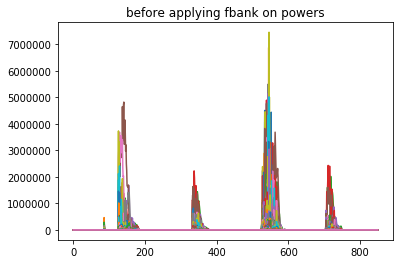

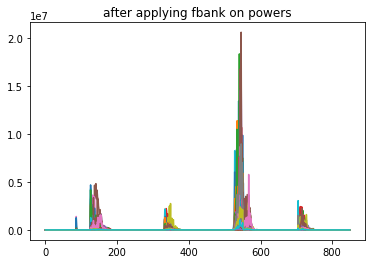

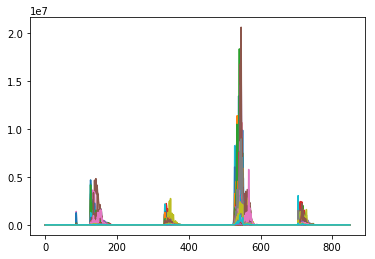

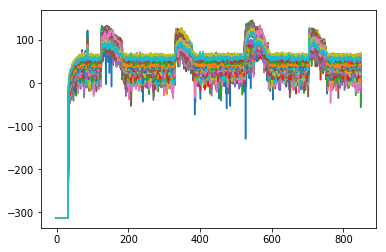

In [97]:
for m in range(1, nfilt + 1):
    f_m_minus = int(bin[m - 1])   
    f_m = int(bin[m])             
    f_m_plus = int(bin[m + 1])   

    for k in range(f_m_minus, f_m):
        fbank[m - 1, k] = (k - bin[m - 1]) / (bin[m] - bin[m - 1])
    for k in range(f_m, f_m_plus):
        fbank[m - 1, k] = (bin[m + 1] - k) / (bin[m + 1] - bin[m])

plt.plot(pow_frames)
plt.title("before applying fbank on powers")
plt.show()

filter_banks = numpy.dot(pow_frames, fbank.T)

plt.plot(filter_banks)
plt.title("after applying fbank on powers")
plt.show()

filter_banks = numpy.where(filter_banks == 0, numpy.finfo(float).eps, filter_banks) 
plt.plot(filter_banks)
plt.show()

filter_banks = 20 * numpy.log10(filter_banks) 
plt.plot(filter_banks)
plt.show()

len(mfcc)=850
mfcc[750]=[-74.49318239  -4.16324835  47.84532426  31.65612602 -12.97615507
 -31.78214096 -24.24422134  -5.26966817 -23.34091954 -30.70223924
   2.72326151  -9.97379294]


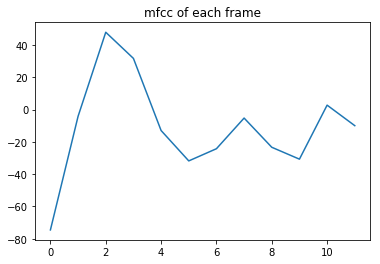

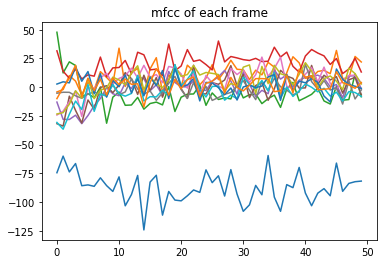

In [98]:
num_ceps = 12
mfcc = dct(filter_banks, type=2, axis=1, norm='ortho')[:, 1 : (num_ceps + 1)] 

print("len(mfcc)={}".format(len(mfcc)))
print("mfcc[750]={}".format(mfcc[750]))

plt.plot(mfcc[750])
plt.title("mfcc of each frame")
plt.show()

plt.plot(mfcc[750:800])
plt.title("mfcc of each frame")
plt.show()

In [99]:
(nframes, ncoeff) = mfcc.shape
print("mfcc.shape={}".format(mfcc.shape))


mfcc.shape=(850, 12)
